## Reading & Understanding Dataset

In [80]:
# Importing Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline
plt.style.use('seaborn-dark-palette')
from scipy import stats

import datetime as dt

import plotly
import plotly.express as px

In [81]:
import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [82]:
# read the dataset

airbnb = pd.read_csv("AB_NYC_2019.csv")
airbnb.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.647,-73.972,Private room,149,1,9,19-10-2018,0.210,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.754,-73.984,Entire home/apt,225,1,45,21-05-2019,0.380,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.809,-73.942,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.685,-73.960,Entire home/apt,89,1,270,05-07-2019,4.640,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.799,-73.944,Entire home/apt,80,10,9,19-11-2018,0.100,1,0


In [83]:
# Dimensions

airbnb.shape

(48895, 16)

In [84]:
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [85]:
airbnb.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.000,48895.000,48895.000,48895.000,48895.000,48895.000,48895.000,38843.000,48895.000,48895.000
mean,19017143.236,67620010.647,40.729,-73.952,152.721,7.030,23.274,1.373,7.144,112.781
std,10983108.386,78610967.033,0.055,0.046,240.154,20.511,44.551,1.680,32.953,131.622
min,2539.000,2438.000,40.500,-74.244,0.000,1.000,0.000,0.010,1.000,0.000
25%,9471945.000,7822033.000,40.690,-73.983,69.000,1.000,1.000,0.190,1.000,0.000
50%,19677284.000,30793816.000,40.723,-73.956,106.000,3.000,5.000,0.720,1.000,45.000
75%,29152178.500,107434423.000,40.763,-73.936,175.000,5.000,24.000,2.020,2.000,227.000
max,36487245.000,274321313.000,40.913,-73.713,10000.000,1250.000,629.000,58.500,327.000,365.000


## Data Cleaning and Manipulation

In [86]:
# Dropping Id column as it is not important in analysis
airbnb.drop('id',axis= 1 ,inplace=True)

### Handling Missing Value

In [87]:
# Missing values % age in each column
# user defined function to calculate missing values

def Missing_Percentage(dataFrame):

    missing_perc = 100*(dataFrame.isna().mean()).sort_values(ascending=False)
    return missing_perc

In [88]:
# Numerical interpretation using user defined function

Missing_Percentage(airbnb)

last_review                      20.558
reviews_per_month                20.558
host_name                         0.043
name                              0.033
host_id                           0.000
neighbourhood_group               0.000
neighbourhood                     0.000
latitude                          0.000
longitude                         0.000
room_type                         0.000
price                             0.000
minimum_nights                    0.000
number_of_reviews                 0.000
calculated_host_listings_count    0.000
availability_365                  0.000
dtype: float64

Missing Number Graph for airbnb data


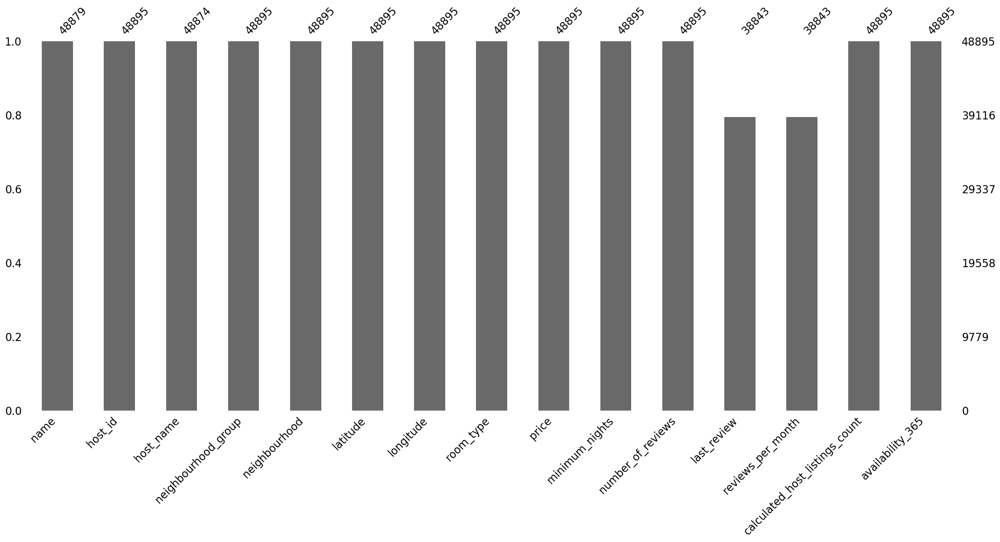

In [89]:
# missing values graphical representation for each column

import missingno as mno
print("Missing Number Graph for airbnb data")
mno.bar(airbnb)
plt.show()

# Full grey bar means no missing values, 
# Higher grey bar means less missing value, 
# Smaller grey bar (white part) means more missing values

`last_review & reviews_per_month` has same null value percentage , now we will handle these values. But lets first see why these values are missing


In [90]:
# analysing why we have null values
airbnb.head()

,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.647,-73.972,Private room,149,1,9,19-10-2018,0.210,6,365
1,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.754,-73.984,Entire home/apt,225,1,45,21-05-2019,0.380,2,355
2,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.809,-73.942,Private room,150,3,0,NaN,NaN,1,365
3,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.685,-73.960,Entire home/apt,89,1,270,05-07-2019,4.640,1,194
4,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.799,-73.944,Entire home/apt,80,10,9,19-11-2018,0.100,1,0


In [91]:
# we saw when number of reviews = zero we have NaN in both the columns (last_review & reviews_per_month)
airbnb[airbnb["number_of_reviews"] == 0].head(10)

,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.809,-73.942,Private room,150,3,0,NaN,NaN,1,365
19,Huge 2 BR Upper East Cental Park,17985,Sing,Manhattan,East Harlem,40.797,-73.949,Entire home/apt,190,7,0,NaN,NaN,2,249
26,Magnifique Suite au N de Manhattan - vue Cloitres,26394,Claude & Sophie,Manhattan,Inwood,40.868,-73.926,Private room,80,4,0,NaN,NaN,1,0
36,Clean and Quiet in Brooklyn,7355,Vt,Brooklyn,Bedford-Stuyvesant,40.689,-73.943,Private room,35,60,0,NaN,NaN,1,365
38,Country space in the city,45445,Harriet,Brooklyn,Flatbush,40.637,-73.963,Private room,150,1,0,NaN,NaN,1,365
193,1 Bedroom in 2 Bdrm Apt- Upper East,236421,Jessica,Manhattan,Upper East Side,40.773,-73.952,Private room,130,14,0,NaN,NaN,2,0
204,Beautiful Uptown Manhattan apartmnt,253385,Douglas,Manhattan,Harlem,40.802,-73.956,Private room,200,30,0,NaN,NaN,1,365
260,LL3,295128,Carol Gloria,Bronx,Clason Point,40.813,-73.855,Private room,90,2,0,NaN,NaN,7,349
265,"HOSTING YOUR SUNNY, SPACIOUS NYC ROOM",312288,Paula,Manhattan,Inwood,40.866,-73.926,Private room,75,7,0,NaN,NaN,2,323
267,Prime East Village 1 Bedroom,146944,David,Manhattan,East Village,40.728,-73.986,Entire home/apt,200,3,0,NaN,NaN,1,0


In [92]:
# This means that when the hosts did not receive any reviews then we have missing values in last_review & reviews_per_month. 
# So these missing values are missing on purpose and not at Random. Lets check how many rows of missing values we have


In [93]:
airbnb[airbnb["number_of_reviews"] == 0].shape[0]

10052

In [94]:
# Replacing the missing values of reviews_per_month with  zero 

airbnb["reviews_per_month"] = airbnb.reviews_per_month.fillna(0)

In [95]:
airbnb.last_review.value_counts().sort_values(ascending=False).head()

23-06-2019    1413
01-07-2019    1359
30-06-2019    1341
24-06-2019     875
07-07-2019     718
Name: last_review, dtype: int64

In [96]:
# last_review is a date Column and we can fill Mode with it but as the missing values are much higher around 20% then filling with mode would make this column values baised as we have almost similar value counts for 3 dates,So for now leaving this column as it is, 
# lets see if we can derive some usefull info about this column

In [97]:
airbnb.isnull().sum()

name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                     0
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [98]:
# we have 21 host_name missing and 16 name missing in our data.Lets check them

In [99]:
# Dropping the "last_review" column temporarily to see name & host_name nulls
airbnb_without_last_review = airbnb.drop("last_review", axis=1)

# Performing the operation on the remaining columns
result = airbnb_without_last_review[airbnb_without_last_review.isnull().any(axis=1)]

# Display the result
result

,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
360,Bienvenue,526653,NaN,Queens,Queens Village,40.724,-73.761,Private room,50,1,43,0.450,1,88
2700,Cozy Studio in Flatbush,7779204,NaN,Brooklyn,Flatbush,40.650,-73.962,Entire home/apt,100,30,49,0.690,1,342
2854,NaN,6676776,Peter,Manhattan,Battery Park City,40.712,-74.016,Entire home/apt,400,1000,0,0.000,1,362
3703,NaN,11395220,Anna,Manhattan,East Village,40.732,-73.988,Entire home/apt,200,1,28,0.450,1,341
5745,SPRING in the City!! Zen-Style Tranquil Bedroom,919218,NaN,Manhattan,Harlem,40.806,-73.951,Private room,86,3,34,1.000,1,359
5775,NaN,20700823,Jesse,Manhattan,Greenwich Village,40.735,-73.992,Entire home/apt,225,1,1,0.020,1,0
5975,NaN,22686810,Michaël,Manhattan,Nolita,40.720,-73.996,Entire home/apt,215,7,5,0.090,1,0
6075,Charming Room in Prospect Heights!,23077718,NaN,Brooklyn,Crown Heights,40.675,-73.961,Private room,50,1,0,0.000,1,0
6269,NaN,21600904,Lucie,Brooklyn,Williamsburg,40.714,-73.944,Private room,150,1,0,0.000,1,0
6567,NaN,1832442,Carolina,Brooklyn,Bushwick,40.700,-73.928,Private room,70,1,0,0.000,1,0


In [100]:
airbnb[airbnb.isnull().any(axis=1)]

,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.809,-73.942,Private room,150,3,0,NaN,0.000,1,365
19,Huge 2 BR Upper East Cental Park,17985,Sing,Manhattan,East Harlem,40.797,-73.949,Entire home/apt,190,7,0,NaN,0.000,2,249
26,Magnifique Suite au N de Manhattan - vue Cloitres,26394,Claude & Sophie,Manhattan,Inwood,40.868,-73.926,Private room,80,4,0,NaN,0.000,1,0
36,Clean and Quiet in Brooklyn,7355,Vt,Brooklyn,Bedford-Stuyvesant,40.689,-73.943,Private room,35,60,0,NaN,0.000,1,365
38,Country space in the city,45445,Harriet,Brooklyn,Flatbush,40.637,-73.963,Private room,150,1,0,NaN,0.000,1,365
193,1 Bedroom in 2 Bdrm Apt- Upper East,236421,Jessica,Manhattan,Upper East Side,40.773,-73.952,Private room,130,14,0,NaN,0.000,2,0
204,Beautiful Uptown Manhattan apartmnt,253385,Douglas,Manhattan,Harlem,40.802,-73.956,Private room,200,30,0,NaN,0.000,1,365
260,LL3,295128,Carol Gloria,Bronx,Clason Point,40.813,-73.855,Private room,90,2,0,NaN,0.000,7,349
265,"HOSTING YOUR SUNNY, SPACIOUS NYC ROOM",312288,Paula,Manhattan,Inwood,40.866,-73.926,Private room,75,7,0,NaN,0.000,2,323
267,Prime East Village 1 Bedroom,146944,David,Manhattan,East Village,40.728,-73.986,Entire home/apt,200,3,0,NaN,0.000,1,0


In [101]:
# These values are missing at random so, we can collect this data later from the host team if required for now we just leave this as it is.

In [102]:
# so our dataframe is almost free from the missing values lets go ahead and do further analysis

In [103]:
airbnb.describe()

,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.000,48895.000,48895.000,48895.000,48895.000,48895.000,48895.000,48895.000,48895.000
mean,67620010.647,40.729,-73.952,152.721,7.030,23.274,1.091,7.144,112.781
std,78610967.033,0.055,0.046,240.154,20.511,44.551,1.597,32.953,131.622
min,2438.000,40.500,-74.244,0.000,1.000,0.000,0.000,1.000,0.000
25%,7822033.000,40.690,-73.983,69.000,1.000,1.000,0.040,1.000,0.000
50%,30793816.000,40.723,-73.956,106.000,3.000,5.000,0.370,1.000,45.000
75%,107434423.000,40.763,-73.936,175.000,5.000,24.000,1.580,2.000,227.000
max,274321313.000,40.913,-73.713,10000.000,1250.000,629.000,58.500,327.000,365.000


In [104]:
## Data is almost free from Missing values, now lets do Outlier Treatment

In [105]:
# lets standardise few coloumn which are actually categorical but their dtype is numerical

# Converting host_id to object

airbnb['host_id'] = airbnb.host_id.astype(str)

In [106]:
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   name                            48879 non-null  object 
 1   host_id                         48895 non-null  object 
 2   host_name                       48874 non-null  object 
 3   neighbourhood_group             48895 non-null  object 
 4   neighbourhood                   48895 non-null  object 
 5   latitude                        48895 non-null  float64
 6   longitude                       48895 non-null  float64
 7   room_type                       48895 non-null  object 
 8   price                           48895 non-null  int64  
 9   minimum_nights                  48895 non-null  int64  
 10  number_of_reviews               48895 non-null  int64  
 11  last_review                     38843 non-null  object 
 12  reviews_per_month               

### Outlier Treatment

In [107]:
num_cols = airbnb.select_dtypes(include=['int64', 'float64']).columns
num_cols

Index(['latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

In [108]:
# UDF for checking Outliers
def Check_Outliers(data,columnList):

    plt.figure(figsize=([16,14]))
    plt.subplots_adjust(wspace=0.4,hspace=0.5)

    for i,j in enumerate(columnList):
        plt.subplot(5,2,i+1)
        sns.boxplot(data[j], orient = "h", color="skyblue")
        plt.xlabel(None)
        plt.ylabel(None)
        plt.suptitle("\nChecking Outliers using Boxplot\n",fontsize=20,color="green",)
        plt.title(j,fontsize=15,color='brown')
        plt.tight_layout()

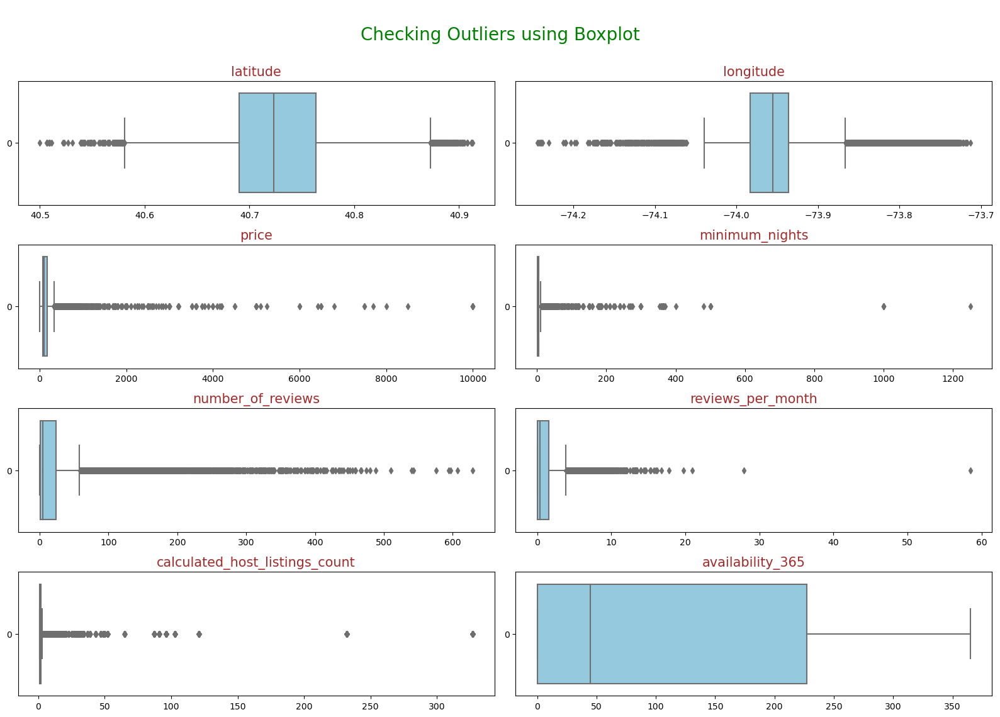

In [109]:
# UDF for boxplot
Check_Outliers(airbnb,num_cols)

In [110]:
## There are clearly Outliers in few columns which we needs to fix


In [111]:
# before outlier treatment
airbnb.describe(percentiles=[.10,.25,.50,.75,.90])

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.000,48895.000,48895.000,48895.000,48895.000,48895.000,48895.000,48895.000
mean,40.729,-73.952,152.721,7.030,23.274,1.091,7.144,112.781
std,0.055,0.046,240.154,20.511,44.551,1.597,32.953,131.622
min,40.500,-74.244,0.000,1.000,0.000,0.000,1.000,0.000
10%,40.668,-73.997,49.000,1.000,0.000,0.000,1.000,0.000
25%,40.690,-73.983,69.000,1.000,1.000,0.040,1.000,0.000
50%,40.723,-73.956,106.000,3.000,5.000,0.370,1.000,45.000
75%,40.763,-73.936,175.000,5.000,24.000,1.580,2.000,227.000
90%,40.805,-73.908,269.000,28.000,70.000,3.250,5.000,337.000
max,40.913,-73.713,10000.000,1250.000,629.000,58.500,327.000,365.000


In [112]:
## Fixing (price , minimum_nights , number_of_reviews , reviews_per_month , calculated_host_listings_count )
# Taking 0.1 and 0.9 as lower and upper bound threshold for flooring & capping

In [113]:
# Defining UDF to treat outliers via capping and flooring

def Outlier_treatment(df,columnList):
    for i in columnList:
        q1 = df[i].describe(percentiles=[0.1,0.9])["10%"]
        q3 = df[i].describe(percentiles=[0.1,0.9])["90%"]
        IQR = q3 - q1

        upper_bound = q3 + 1.5*IQR
        lower_bound = q1 - 1.5*IQR

        # capping upper_bound
        df[i] = np.where(df[i] > upper_bound, upper_bound,df[i])

        # flooring lower_bound
        df[i] = np.where(df[i] < lower_bound, lower_bound,df[i])

In [114]:
capping_cols = ['price' , 'minimum_nights' , 'number_of_reviews' , 'reviews_per_month' , 'calculated_host_listings_count']

# UDF 
Outlier_treatment(airbnb,capping_cols)

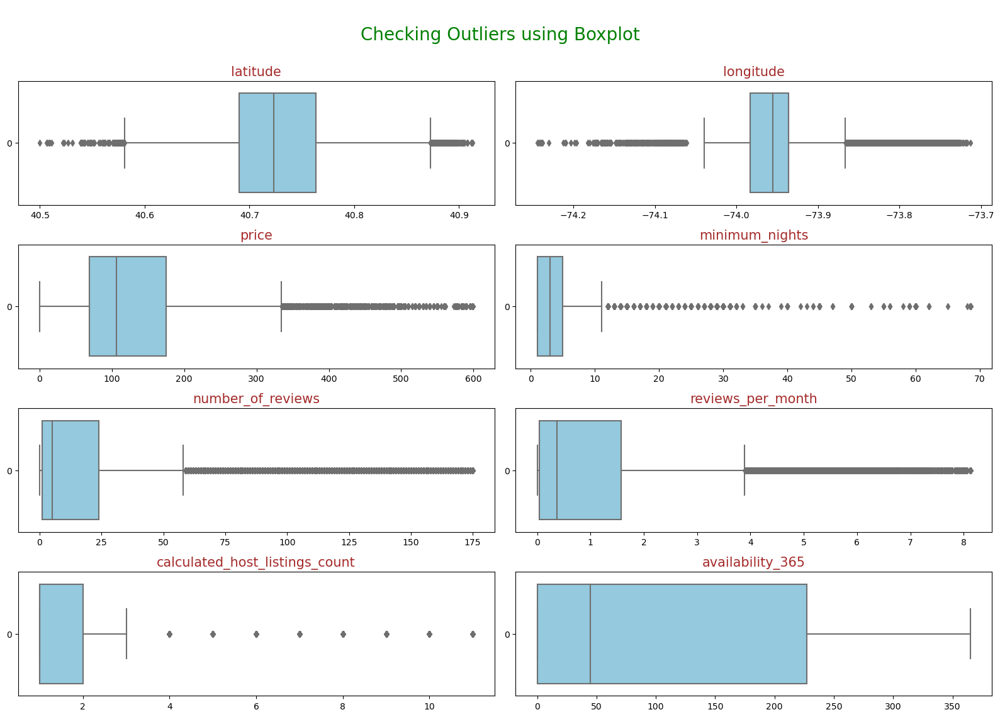

In [115]:
# Checking outliers using boxplot after fixing them 

# UDF for boxplot
Check_Outliers(airbnb,num_cols)

In [116]:
# We have removed the outliers as we can see in the before and after Boxplots , 
# There are still values outside Upper Whisker of Boxplot but they are not outliers they are actual values 
# (Not outliers because these values are gradually increasing and constantly ). 
# So we can Bin them for furthur analysis

### Time for some Feature Engineering 

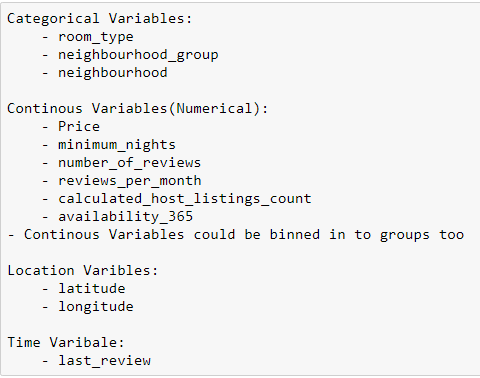

In [117]:
## We will be performing Binning for Continous Variables that we discussed above using Boxplot
## After binning these Continous Variables we will have some new categorical variables

In [118]:
airbnb.head()

,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.647,-73.972,Private room,149.000,1.000,9.000,19-10-2018,0.210,6.000,365
1,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.754,-73.984,Entire home/apt,225.000,1.000,45.000,21-05-2019,0.380,2.000,355
2,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.809,-73.942,Private room,150.000,3.000,0.000,NaN,0.000,1.000,365
3,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.685,-73.960,Entire home/apt,89.000,1.000,175.000,05-07-2019,4.640,1.000,194
4,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.799,-73.944,Entire home/apt,80.000,10.000,9.000,19-11-2018,0.100,1.000,0


In [119]:
#after
airbnb.describe(percentiles=[.10,.25,.50,.75,.90])

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.000,48895.000,48895.000,48895.000,48895.000,48895.000,48895.000,48895.000
mean,40.729,-73.952,141.355,6.313,22.047,1.080,2.261,112.781
std,0.055,0.046,109.645,10.247,37.991,1.518,2.654,131.622
min,40.500,-74.244,0.000,1.000,0.000,0.000,1.000,0.000
10%,40.668,-73.997,49.000,1.000,0.000,0.000,1.000,0.000
25%,40.690,-73.983,69.000,1.000,1.000,0.040,1.000,0.000
50%,40.723,-73.956,106.000,3.000,5.000,0.370,1.000,45.000
75%,40.763,-73.936,175.000,5.000,24.000,1.580,2.000,227.000
90%,40.805,-73.908,269.000,28.000,70.000,3.250,5.000,337.000
max,40.913,-73.713,599.000,68.500,175.000,8.125,11.000,365.000


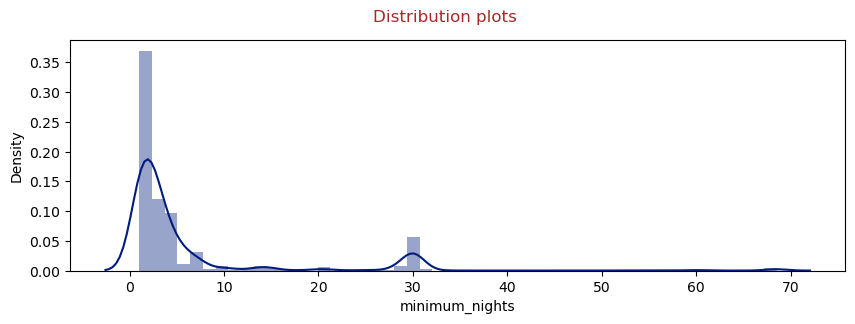

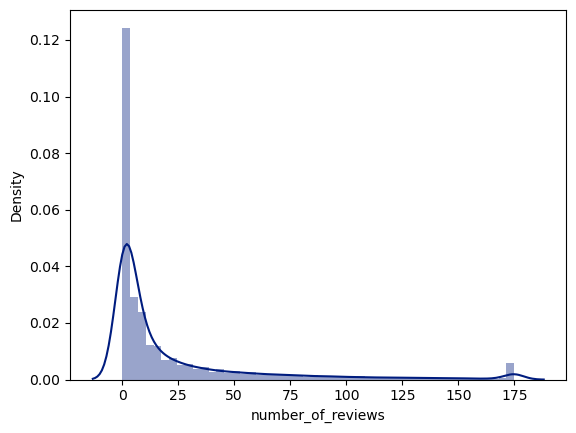

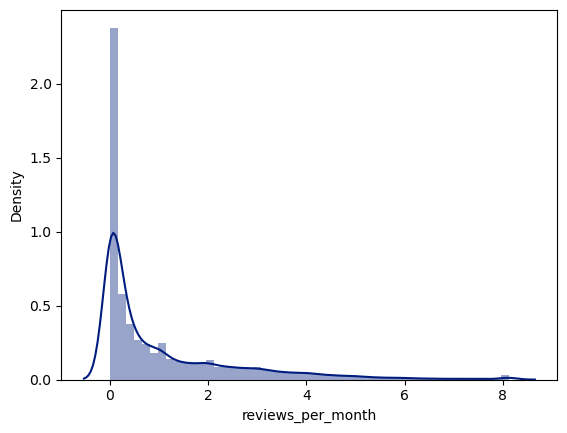

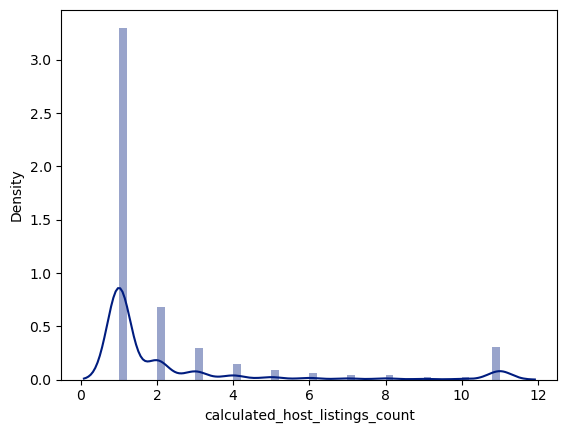

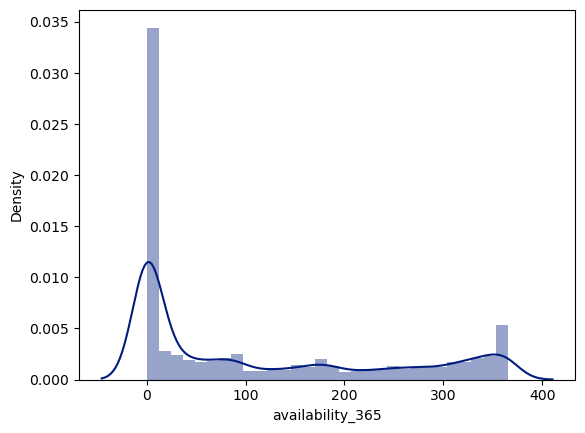

In [120]:

dist_cols = ['minimum_nights' , 'number_of_reviews' , 'reviews_per_month' , 'calculated_host_listings_count', 'availability_365']

plt.figure(figsize=[10,3])
plt.subplots_adjust(wspace=0.5)
plt.suptitle('Distribution plots',color="brown")

for index,col in enumerate(dist_cols):
    sns.distplot(airbnb[col])
    plt.show()

In [121]:
# Binning for 'minimum_nights' into a new column 'minimum_nights_grp'

bins=np.arange(0,71,10)
grp= ["<10", "10 to 20", "20 to 30", "30 to 40", "40 to 50", "50 to 60", "60+"]

airbnb["minimum_nights_grp"] = pd.cut(airbnb['minimum_nights'],bins,labels=grp)

# Also converting the 'minimum_nights_grp' to object dtype
airbnb['minimum_nights_grp'] = airbnb['minimum_nights_grp'].astype(str)  


In [122]:
# Binning for 'number_of_reviews' into a new column 'number_of_reviews_grp'
bins=[-1,50,100,150,200]
grp=["<50", "50 to 100", "100 to 150", "150+"]

airbnb["number_of_reviews_grp"] = pd.cut(airbnb['number_of_reviews'],bins, labels=grp)

# Also converting the 'number_of_reviews_grp' to object dtype
airbnb['number_of_reviews_grp'] = airbnb['number_of_reviews_grp'].astype(str)  

airbnb["number_of_reviews_grp"].value_counts()

<50           41936
50 to 100      3964
100 to 150     1650
150+           1345
Name: number_of_reviews_grp, dtype: int64

In [123]:
# Binning for 'reviews_per_month' into a new column 'reviews_per_month_grp'
bins=[-10,2,4,6,100]
grp=["<2", "2 to 4", "4 to 6", "6+"]

airbnb["reviews_per_month_grp"] = pd.cut(airbnb['reviews_per_month'], bins,labels=grp)

# Also converting the 'reviews_per_month_grp' to object dtype
airbnb['reviews_per_month_grp'] = airbnb['reviews_per_month_grp'].astype(str)


In [124]:
# Binning for 'calculated_host_listings_count' into a new column 'calculated_host_listings_count_grp'
bins = np.arange(0,13,3)
grp = ["<3", "3 to 6", "6 to 9", "9+"]

airbnb["calculated_host_listings_count_grp"] = pd.cut(airbnb['calculated_host_listings_count'], bins ,labels = grp)

# Also converting the 'calculated_host_listings_count_grp' to object dtype
airbnb['calculated_host_listings_count_grp'] = airbnb['calculated_host_listings_count_grp'].astype(str)


In [125]:
# Binning for 'availability_365' into a new column 'availability_365_grp'
bins = np.arange(-1,401,100)
grp = ["<100", "100 to 200", "200 to 300", "300+"]

airbnb["availability_365_grp"] = pd.cut(airbnb['availability_365'], bins, labels= grp)

# Also converting the 'availability_365_grp' to object dtype
airbnb['availability_365_grp'] = airbnb['availability_365_grp'].astype(str)


In [126]:
# Binning for 'price' into a new column 'price_grp'
bins = [-1,100,200,300,500,700]
grp = ["<100", "100 to 200", "200 to 300", "300 to 500", "500+"]

airbnb["price_grp"] = pd.cut(airbnb['price'], bins, labels= grp)

# Also converting the 'price_grp' to object dtype
airbnb['price_grp'] = airbnb['price_grp'].astype(str)

In [127]:
# using for Binned categorical grouped columns in airbnb
def valuesPerc(data,columnsList):
    for i in columnsList:
        perc=100*data[i].value_counts(normalize=True)
        print("value_counts % for :",i,"\n")
        print(perc,"\n")
        print("___"*40,"\n")

In [128]:
grp_cols  = ['minimum_nights_grp' , 'number_of_reviews_grp' , 'reviews_per_month_grp' , 'calculated_host_listings_count_grp', 'availability_365_grp',"price_grp"]
valuesPerc(airbnb,grp_cols)

value_counts % for : minimum_nights_grp 

<10        86.420
20 to 30    9.373
10 to 20    2.679
60+         0.679
30 to 40    0.495
50 to 60    0.247
40 to 50    0.106
Name: minimum_nights_grp, dtype: float64 

________________________________________________________________________________________________________________________ 

value_counts % for : number_of_reviews_grp 

<50          85.767
50 to 100     8.107
100 to 150    3.375
150+          2.751
Name: number_of_reviews_grp, dtype: float64 

________________________________________________________________________________________________________________________ 

value_counts % for : reviews_per_month_grp 

<2       80.029
2 to 4   13.862
4 to 6    4.571
6+        1.538
Name: reviews_per_month_grp, dtype: float64 

________________________________________________________________________________________________________________________ 

value_counts % for : calculated_host_listings_count_grp 

<3       85.518
9+        6.498
3 to

In [129]:
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 21 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   name                                48879 non-null  object 
 1   host_id                             48895 non-null  object 
 2   host_name                           48874 non-null  object 
 3   neighbourhood_group                 48895 non-null  object 
 4   neighbourhood                       48895 non-null  object 
 5   latitude                            48895 non-null  float64
 6   longitude                           48895 non-null  float64
 7   room_type                           48895 non-null  object 
 8   price                               48895 non-null  float64
 9   minimum_nights                      48895 non-null  float64
 10  number_of_reviews                   48895 non-null  float64
 11  last_review                         38843

In [130]:
airbnb.head()

,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,minimum_nights_grp,number_of_reviews_grp,reviews_per_month_grp,calculated_host_listings_count_grp,availability_365_grp,price_grp
0,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.647,-73.972,Private room,149.000,1.000,9.000,19-10-2018,0.210,6.000,365,<10,<50,<2,3 to 6,300+,100 to 200
1,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.754,-73.984,Entire home/apt,225.000,1.000,45.000,21-05-2019,0.380,2.000,355,<10,<50,<2,<3,300+,200 to 300
2,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.809,-73.942,Private room,150.000,3.000,0.000,NaN,0.000,1.000,365,<10,<50,<2,<3,300+,100 to 200
3,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.685,-73.960,Entire home/apt,89.000,1.000,175.000,05-07-2019,4.640,1.000,194,<10,150+,4 to 6,<3,100 to 200,<100
4,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.799,-73.944,Entire home/apt,80.000,10.000,9.000,19-11-2018,0.100,1.000,0,<10,<50,<2,<3,<100,<100


In [131]:
# Replacing the remaining Null values with a Unreviewed option

airbnb['last_review'] = airbnb['last_review'].fillna("Unreviewed")


In [132]:
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 21 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   name                                48879 non-null  object 
 1   host_id                             48895 non-null  object 
 2   host_name                           48874 non-null  object 
 3   neighbourhood_group                 48895 non-null  object 
 4   neighbourhood                       48895 non-null  object 
 5   latitude                            48895 non-null  float64
 6   longitude                           48895 non-null  float64
 7   room_type                           48895 non-null  object 
 8   price                               48895 non-null  float64
 9   minimum_nights                      48895 non-null  float64
 10  number_of_reviews                   48895 non-null  float64
 11  last_review                         48895

In [133]:
airbnb.head()

,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,minimum_nights_grp,number_of_reviews_grp,reviews_per_month_grp,calculated_host_listings_count_grp,availability_365_grp,price_grp
0,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.647,-73.972,Private room,149.000,1.000,9.000,19-10-2018,0.210,6.000,365,<10,<50,<2,3 to 6,300+,100 to 200
1,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.754,-73.984,Entire home/apt,225.000,1.000,45.000,21-05-2019,0.380,2.000,355,<10,<50,<2,<3,300+,200 to 300
2,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.809,-73.942,Private room,150.000,3.000,0.000,Unreviewed,0.000,1.000,365,<10,<50,<2,<3,300+,100 to 200
3,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.685,-73.960,Entire home/apt,89.000,1.000,175.000,05-07-2019,4.640,1.000,194,<10,150+,4 to 6,<3,100 to 200,<100
4,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.799,-73.944,Entire home/apt,80.000,10.000,9.000,19-11-2018,0.100,1.000,0,<10,<50,<2,<3,<100,<100


In [134]:
airbnb.shape

(48895, 21)

In [135]:
Missing_Percentage(airbnb)

host_name                            0.043
name                                 0.033
last_review                          0.000
availability_365_grp                 0.000
calculated_host_listings_count_grp   0.000
reviews_per_month_grp                0.000
number_of_reviews_grp                0.000
minimum_nights_grp                   0.000
availability_365                     0.000
calculated_host_listings_count       0.000
reviews_per_month                    0.000
number_of_reviews                    0.000
host_id                              0.000
minimum_nights                       0.000
price                                0.000
room_type                            0.000
longitude                            0.000
latitude                             0.000
neighbourhood                        0.000
neighbourhood_group                  0.000
price_grp                            0.000
dtype: float64

In [136]:
# Extracting the Cleaned data for Tableau Analysis

#airbnb.to_csv('AB_NYC_2019(Cleaned)V2.2.csv',index=False)

## EDA

In [142]:
cat_cols = ['neighbourhood_group','room_type','minimum_nights_grp',
            'number_of_reviews_grp','reviews_per_month_grp',
            'availability_365_grp','price_grp',
            'calculated_host_listings_count_grp']

num_cols = ['price','minimum_nights','number_of_reviews','availability_365']

#### Univariate Analysis of Categorical columns

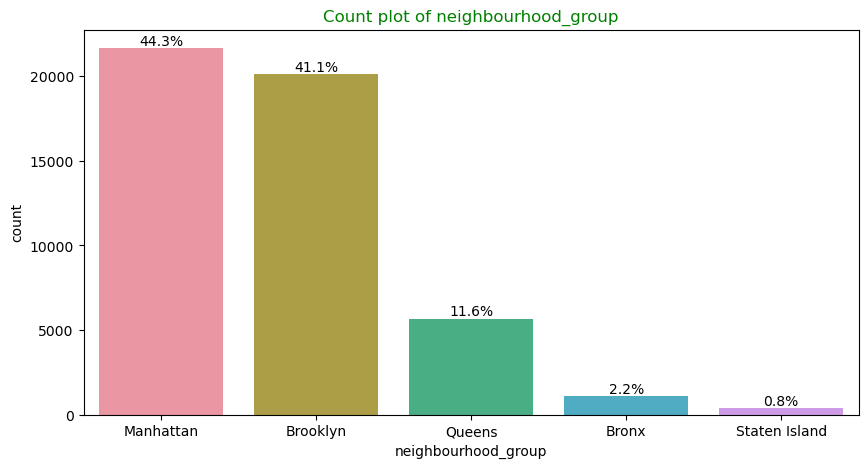

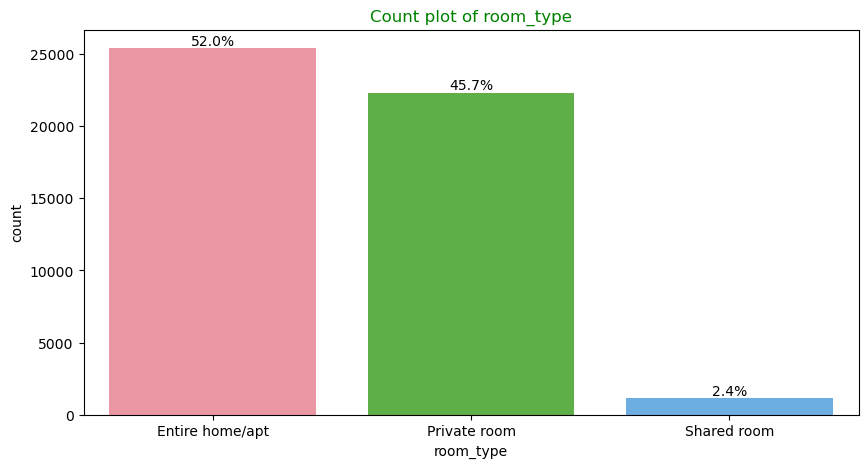

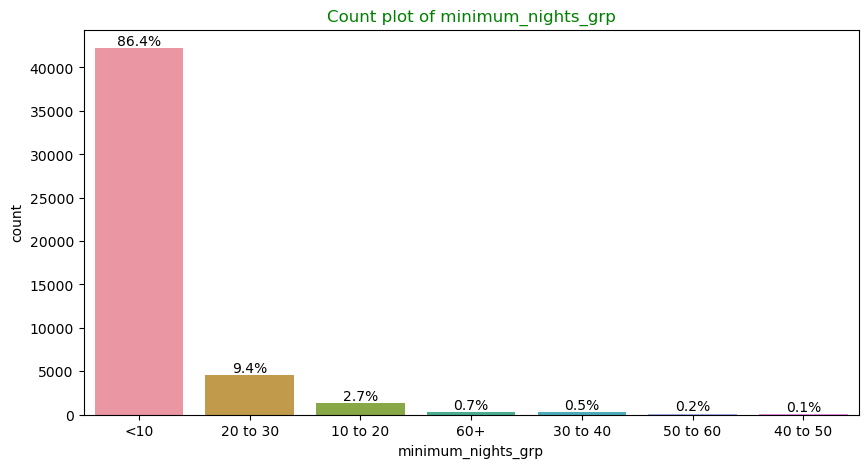

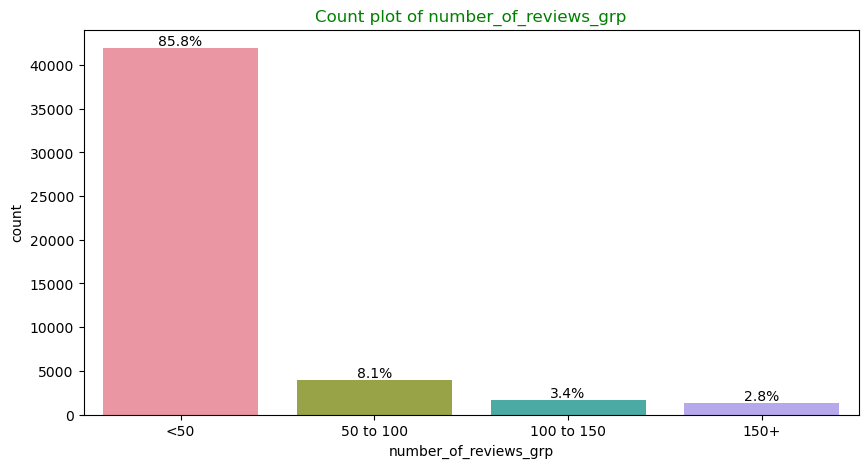

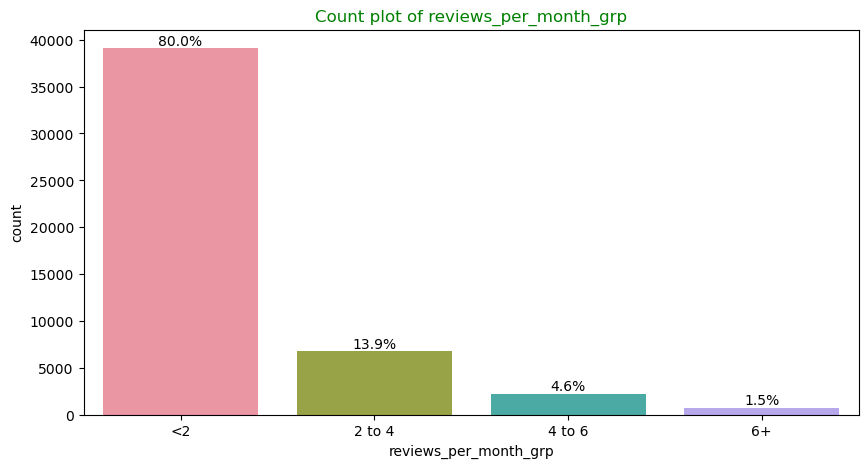

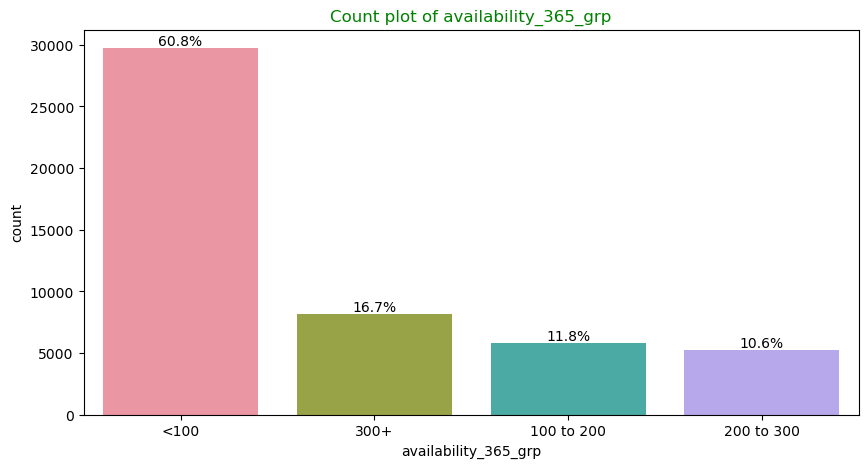

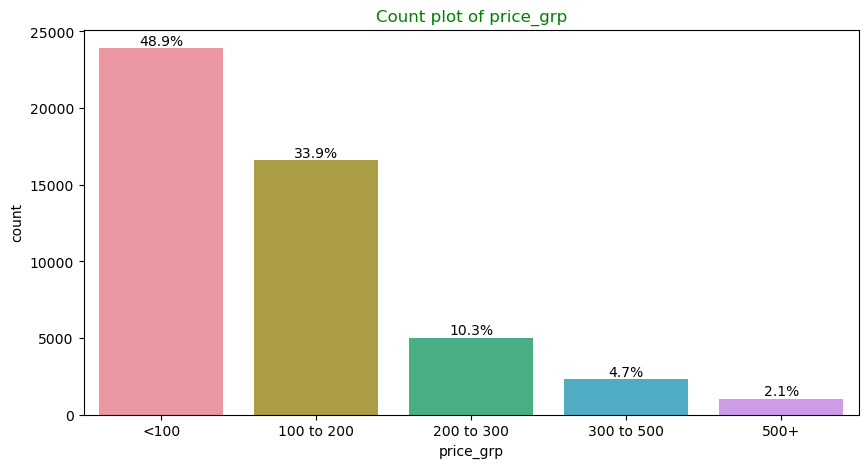

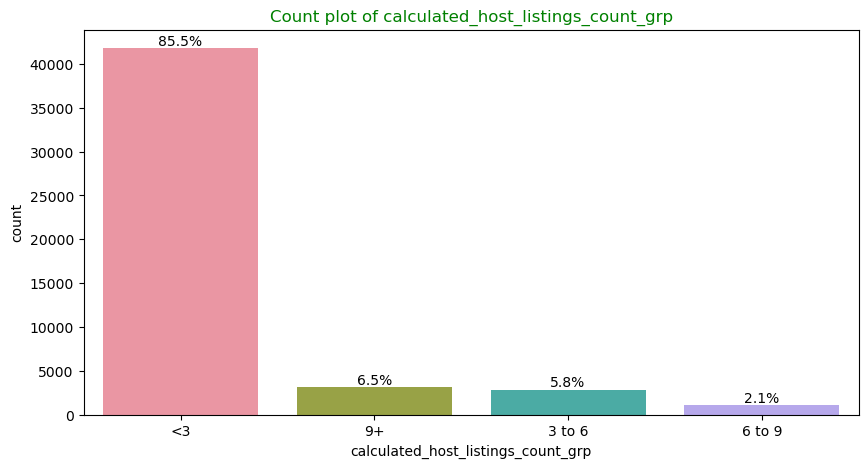

In [144]:

# Define the colors for the blue-teal color scheme
color_left = "#004E64"  # Left side color (e.g., darker teal)
color_right = "#00B1B5"  # Right side color (e.g., lighter teal)

# Create the blue-teal color palette
blue_teal_palette = sns.color_palette([color_left, color_right])

# Set the color palette
sns.set_palette(blue_teal_palette)

# Countplot of columns with value_counts percentage as annotation
for i in cat_cols:
    plt.figure(figsize=[10, 5])
    plt.title("Count plot of {}".format(i), color="green")
    large_to_small = airbnb.groupby(i).size().sort_values().index[::-1]
    ax = sns.countplot(x=i, data=airbnb, order=large_to_small)
    total = len(airbnb[i])
    plt.xticks(rotation=0)

    for p in ax.patches:
        text = '{:.1f}%'.format(100 * p.get_height() / total)
        x = p.get_x() + p.get_width() / 2.
        y = p.get_height()

        ax.annotate(text, (x, y), ha='center', va='center', xytext=(0, 5), textcoords='offset points')


#### Bivariate Analysis for Numerical Variables

<Figure size 1600x400 with 0 Axes>

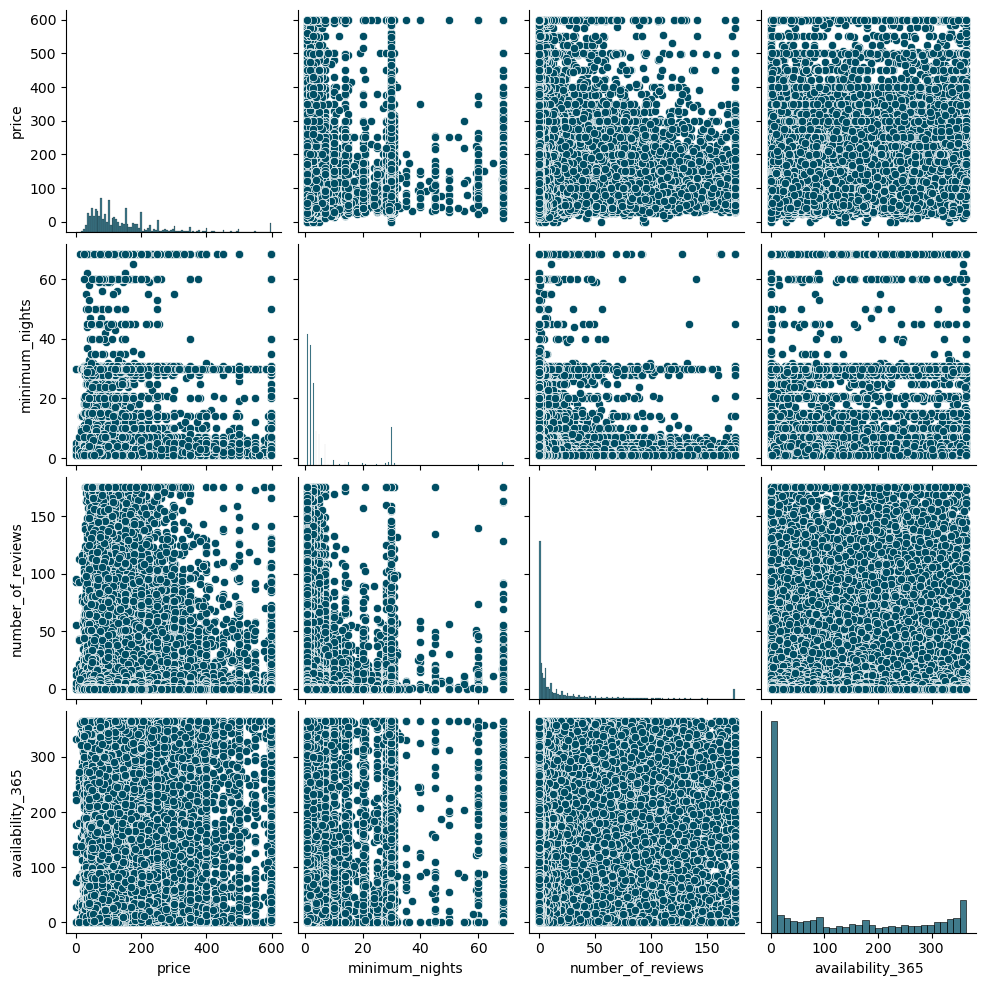

In [146]:
plt.figure(figsize=(16, 4))
sns.pairplot(data=airbnb,vars=num_cols)                                  
plt.show()

#### No correlation found between Numerical Columns

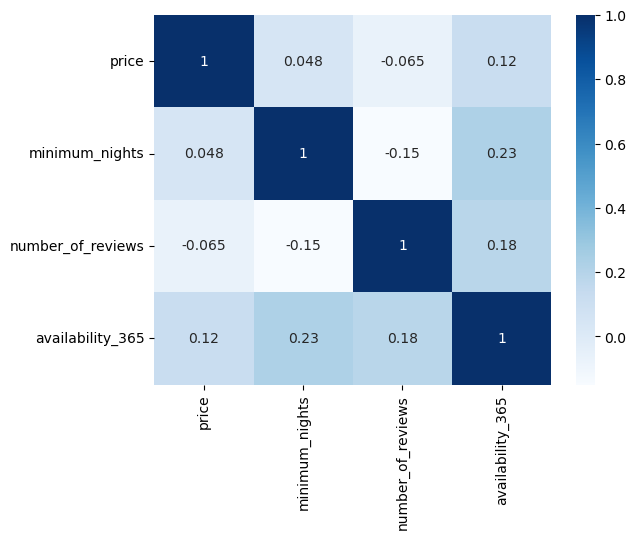

In [147]:
# Heatmap to show correlation between numerical variables
sns.heatmap(data=airbnb[num_cols].corr(),cmap="Blues",annot=True)
plt.show()